<a href="https://colab.research.google.com/github/jorgementx/propuestas_trabajo_falsas_analisis_entrenamiento/blob/main/poster.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**PROYECTO POSTER - JORGE MENTXAKA**

# **Imports**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import re
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import io
import string

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer

from sklearn.utils import resample
from sklearn import metrics
from sklearn.model_selection import train_test_split

from gensim.models import Word2Vec
from gensim.models.phrases import Phrases, Phraser
from collections import defaultdict
from wordcloud import WordCloud
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
#plt.style.use("ggplot")
import seaborn as sns
from math import *
from decimal import Decimal

import pickle
import multiprocessing
import sys
import collections

import folium
from folium.plugins import HeatMap

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


# **Cargando datos**

In [ ]:
#train_set = "/content/drive/MyDrive/Mineria/fake_job_postings.csv"
train_set = "/content/drive/MyDrive/Mineria/prueba.csv" #igual al de arriba pero con coordenadas

In [ ]:
X = pd.read_csv(train_set)

# **Analísis de datos**

In [ ]:
len(X.index)

17880

In [ ]:
X.head()

,job_id,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent,lugar
0,1,Marketing Intern,"US, NY, New York",Marketing,NaN,"We're Food52, and we've created a groundbreaki...","Food52, a fast-growing, James Beard Award-winn...",Experience with content management systems a m...,NaN,0,1,0,Other,Internship,NaN,NaN,Marketing,0,"(40.7127281, -74.0060152)"
1,2,Customer Service - Cloud Video Production,"NZ, , Auckland",Success,NaN,"90 Seconds, the worlds Cloud Video Production ...",Organised - Focused - Vibrant - Awesome!Do you...,What we expect from you:Your key responsibilit...,What you will get from usThrough being part of...,0,1,0,Full-time,Not Applicable,NaN,Marketing and Advertising,Customer Service,0,"(-36.852095, 174.7631803)"
2,3,Commissioning Machinery Assistant (CMA),"US, IA, Wever",NaN,NaN,Valor Services provides Workforce Solutions th...,"Our client, located in Houston, is actively se...",Implement pre-commissioning and commissioning ...,NaN,0,1,0,NaN,NaN,NaN,NaN,NaN,0,"(40.7116287, -91.2322109)"
3,4,Account Executive - Washington DC,"US, DC, Washington",Sales,NaN,Our passion for improving quality of life thro...,THE COMPANY: ESRI – Environmental Systems Rese...,"EDUCATION: Bachelor’s or Master’s in GIS, busi...",Our culture is anything but corporate—we have ...,0,1,0,Full-time,Mid-Senior level,Bachelor's Degree,Computer Software,Sales,0,"(38.8950368, -77.0365427)"
4,5,Bill Review Manager,"US, FL, Fort Worth",NaN,NaN,SpotSource Solutions LLC is a Global Human Cap...,JOB TITLE: Itemization Review ManagerLOCATION:...,QUALIFICATIONS:RN license in the State of Texa...,Full Benefits Offered,0,1,1,Full-time,Mid-Senior level,Bachelor's Degree,Hospital & Health Care,Health Care Provider,0,"(26.880495, -82.21849059909829)"


In [ ]:
X.loc[X['fraudulent'] == 1][:5] #analizando columna más representativa para usar en el entrenamiento

865

En base a este pequeño analisis saco la condlusión de que el atributo que más información nos puede dar es la descripción. Aunque podría ser buena idea hacer uso de la ausencia o presencia de otros atributos para entrenar un modelo (por ejemplo los requeriemientos o si tiene logo de la compañia). A pesar de todo he decidido usar únicamente la descripción porque parece más interesante para la tarea de NLP.

In [ ]:
X['description'].isnull().values.sum() #numero de valores nulos; alternativamente user .any para devolver un booleano

1

In [ ]:
X.loc[X['description'].isnull()] #fila con descripción nula

,job_id,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent,lugar
17513,17514,Office Manager,"PL, MZ, Warsaw",NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,1,"(52.2319581, 21.0067249)"


## Visualizar en un mapa

In [ ]:
#ESTO LO HE EJECUTADO EN UN SERVIDOR EN PYTHON:
#nohup python3 main.py &
#disown
from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent="job-postings")

# Get latitude and longitude by using city name
def get_location(adress):
    location = geolocator.geocode(adress)
    return location.latitude, location.longitude

# Get lat and lng
X['lugar'] = 1
for index, row in X.iterrows():
    count = 0
    while count < 5:
        try:
            latlong = str(get_location(row['location']))
            X.loc[index,'coordenadas'] = latlong
            #print(latlong)
            count = 6
        except:
            count += 1
    #time.sleep(5)

X.to_pickle("/content/drive/MyDrive/Mineria/fake_job_locations.pkl")
X.to_csv('/content/drive/MyDrive/Mineria/prueba.csv',index=False) #el csv que se carga al principio

In [ ]:
print("Número de instancias con las coordenadas mal calculadas: ", X.loc[X['lugar'] == '1'].shape[0])

Número de instancias con las coordenadas mal calculadas:  1795


In [ ]:
#las coordenadas de "GB, LND, London" estan mal, devuelven 1 por eso como solución provisional las cambio a -> 51.5073219,-0.1276474
X.loc[X['location'] == 'GB, LND, London','lugar']='(51.5073219, -0.1276474)'
#lo mismo pero con US, , Stocton, CA (esto es un problema de formato sería US, CA, Stocton)-> 37.961632, -121.275604
X.loc[X['location'] == 'US, , Stocton, CA','lugar']='(37.961632, -121.275604)'
#GB, GBN, London
X.loc[X['location'] == 'GB, GBN, London','lugar']='(51.5073219, -0.1276474)'
#GB, LND, Shoreditch
X.loc[X['location'] == 'GB, LND, Shoreditch','lugar']='(51.5073219, -0.1276474)'
#GB, BIR, Birmingham
X.loc[X['location'] == 'GB, BIR, Birmingham','lugar']='(52.489471, -1.898575)'

In [ ]:
print("Número de instancias con las coordenadas mal calculadas: ", X.loc[X['lugar'] == '1'].shape[0])

Número de instancias con las coordenadas mal calculadas:  997


### Mapa para comparar instancias verdaderas y falsas

In [ ]:
# separar coordenadas en lat y lng
locations = pd.DataFrame(X['lugar'].str.split(' ',1).tolist(),columns = ['lat','lng'])
locations = pd.concat([X['location'],X['fraudulent'], locations], axis=1)
# quitar caracterres inutiles
locations['lat'] = locations['lat'].str.replace('(','')
locations['lat'] = locations['lat'].str.replace(',','')
locations['lng'] = locations['lng'].str.replace(')','')
#convertir a float
locations['lat'] = locations['lat'].astype(float)
locations['lng'] = locations['lng'].astype(float)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  import sys


In [ ]:
locations = locations[locations['lat'].notnull()] #filtrar los valores nulos
locations = locations[locations['lng'].notnull()]

#se podria filtrar para que solo hubiera 1 instancia por coordenada y tardar mucho menos
plot_map = folium.Map(prefer_canvas=True)

def plotDot(lat,lng,col):
    folium.CircleMarker(location=[lat, lng],
                        radius=1, color = col,
                        weight=5).add_to(plot_map)

#iterar por las instancias verdadaderas y las falsas
genuine = locations.loc[locations['fraudulent'] == 0]
fake = locations.loc[locations['fraudulent'] == 1]
genuine.apply(lambda x: plotDot(x['lat'],x['lng'],'blue'), axis = 1) #las verdaderas azules
fake.apply(lambda x: plotDot(x['lat'],x['lng'],'red'), axis = 1)  #las falsas rojas

#Set the zoom to the maximum possible
plot_map.fit_bounds(plot_map.get_bounds())

#guardar en html
#plot_map.save('html_map_output/simple_dot_plot.html')

plot_map

### Mapa para ver densidad de instancias

In [ ]:
loccount = X['location'].value_counts().reset_index() #dejar una unica instancia por coordenada con el numero de apariciones de la misma
loccount.columns = ['location','count']
loccount['coordinates'] = loccount['location'].apply(lambda x: X.loc[X['location'] == x, 'lugar'].iloc[0])

In [ ]:
loccount_temp = pd.DataFrame(loccount['coordinates'].str.split(' ',1).tolist(),columns = ['lat','lng'])
loccount = pd.concat([loccount['location'], loccount['count'], loccount_temp], axis=1)

In [ ]:

loccount['lat'] = loccount['lat'].str.replace('(','')
loccount['lat'] = loccount['lat'].str.replace(',','')
loccount['lng'] = loccount['lng'].str.replace(')','')

loccount['lat'] = loccount['lat'].astype(float)
loccount['lng'] = loccount['lng'].astype(float)
loccount['count'] = loccount['count'].astype(float)

In [ ]:
#loccount = loccount[loccount['lat'].notnull()] #filtrar los valores nulos
#loccount = loccount[loccount['lng'].notnull()] #filtrar los valores nulos
loccount = loccount.dropna()  #filtrar los valores nulos

hmap = folium.Map(location=[0, 0], control_scale = True, attr='USGS style',zoom_start=1.5)
tmp_data = loccount[['lat', 'lng', 'count']]
data = tmp_data.values.tolist()
HeatMap(data, radius=9).add_to(hmap)
hmap

In [ ]:
hmap.save("/content/drive/MyDrive/Mineria/heatmap.html")

# **Preprocesamiento**

In [ ]:
X = X[['description','fraudulent']]
#X = X.drop(X.columns[[0,1,2,3,4,5,7,8,9,10,11,12,13,14,15,16]], axis=1)
#se puede usar del X['column']

In [ ]:
X.head(10)

,description,fraudulent
0,"Food52, a fast-growing, James Beard Award-winn...",0
1,Organised - Focused - Vibrant - Awesome!Do you...,0
2,"Our client, located in Houston, is actively se...",0
3,THE COMPANY: ESRI – Environmental Systems Rese...,0
4,JOB TITLE: Itemization Review ManagerLOCATION:...,0
5,Job OverviewApex is an environmental consultin...,0
6,Your Responsibilities: Manage the English-spea...,0
7,Who is Airenvy?Hey there! We are seasoned entr...,0
8,Implementation/Configuration/Testing/Training ...,0
9,The Customer Service Associate will be based i...,0


## Limpieza

In [ ]:
X = X[X['description'].notnull()] #filtrar los valores nulos
#X.dropna(subset=[7])
len(X.index)

17879

In [ ]:
stop_words = set(stopwords.words('english')) #tokenizar, stopwords, signos de putuación y mayúsculas a minúsculas
tokenizer = RegexpTokenizer(r'\w+')
X['clean'] = X['description'].apply(lambda x: [w.lower() for w in tokenizer.tokenize(x) if w.lower() not in stop_words])

In [ ]:
X.head(10)

,description,fraudulent,clean
0,"Food52, a fast-growing, James Beard Award-winn...",0,"[food52, fast, growing, james, beard, award, w..."
1,Organised - Focused - Vibrant - Awesome!Do you...,0,"[organised, focused, vibrant, awesome, passion..."
2,"Our client, located in Houston, is actively se...",0,"[client, located, houston, actively, seeking, ..."
3,THE COMPANY: ESRI – Environmental Systems Rese...,0,"[company, esri, environmental, systems, resear..."
4,JOB TITLE: Itemization Review ManagerLOCATION:...,0,"[job, title, itemization, review, managerlocat..."
5,Job OverviewApex is an environmental consultin...,0,"[job, overviewapex, environmental, consulting,..."
6,Your Responsibilities: Manage the English-spea...,0,"[responsibilities, manage, english, speaking, ..."
7,Who is Airenvy?Hey there! We are seasoned entr...,0,"[airenvy, hey, seasoned, entrepreneurs, heart,..."
8,Implementation/Configuration/Testing/Training ...,0,"[implementation, configuration, testing, train..."
9,The Customer Service Associate will be based i...,0,"[customer, service, associate, based, phoenix,..."


Habría que considerar no quitar stopwords poruque pueden demostrar como suelen estar escritas las descripciones de los trabajos (el uso de we...).

In [ ]:
sent = X['clean']
phrases = Phrases(sent, min_count=30, progress_per=10000)
bigram = Phraser(phrases)
sentences = bigram[sent]

In [ ]:
word_freq = defaultdict(int)
for s in sentences:
    for i in s:
        word_freq[i] += 1
print(len(word_freq))

64395


In [ ]:
words=sorted(word_freq, key=word_freq.get, reverse=True)
print(words[0:100])

['team', 'work', 'company', 'business', 'experience', 'sales', 'new', 'development', 'product', 'management', 'looking', 'support', 'marketing', 'amp', 'design', 'clients', 'customers', 'client', 'position', 'customer', 'working', 'services', 'role', 'data', 'including', 'project', 'responsible', 'provide', 'skills', 'service', 'based', 'ensure', 'job', 'people', 'software', 'solutions', 'technical', 'products', 'well', 'develop', 'required', 'help', 'technology', 'process', 'projects', 'environment', 'also', 'manager', 'within', 'build', 'manage', 'knowledge', 'requirements', 'systems', 'one', 'opportunity', 'time', 'maintain', 'quality', 'growth', 'us', 'information', 'customer_service', 'performance', 'web', 'training', 'industry', 'teams', 'make', 'create', 'responsibilities', 'office', 'strong', 'ability', 'operations', 'lead', 'great', 'building', 'must', 'needs', 'engineering', 'using', 'key', 'content', 'best', 'opportunities', 'part', 'system', 'need', 'professional', 'growing

Text(0.5, 1.0, '')

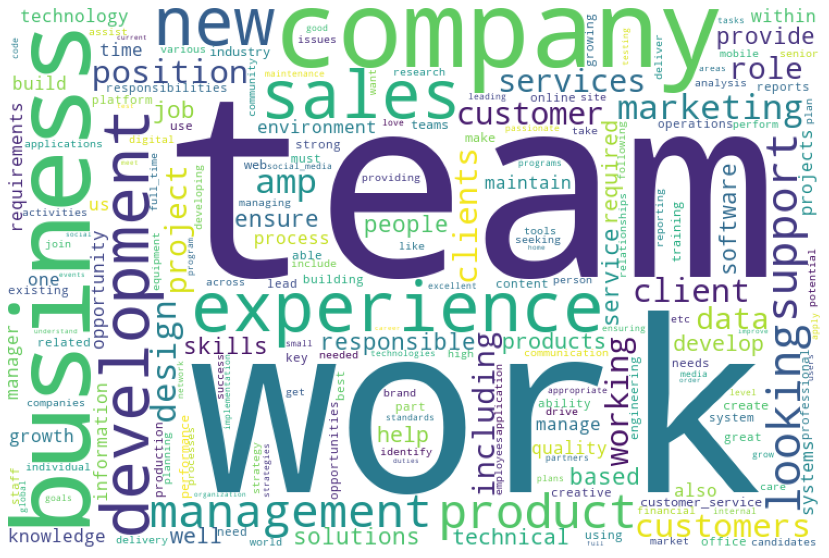

In [ ]:
plt.figure(figsize=(15,10))
wordcloud = WordCloud(background_color='white',width=750,height=500).fit_words(word_freq) # fixed
plt.imshow(wordcloud)
plt.axis('off')
plt.title('',fontsize=20)

Los resultados son lo que nos podemos esperar del texto de una entrevista de trabajo, donde palabras como trabajo, negocio, equipo, empresa, producto, etc., predominan.

## Cargar modelo W2V 

In [ ]:
filename = "/content/drive/MyDrive/Mineria/w2v_2.sav"
w2v_model = pickle.load(open(filename, 'rb'))

## Crear modelo *W2V*

In [ ]:
cores = multiprocessing.cpu_count()
print(cores)

2


In [ ]:
w2v_model = Word2Vec(sentences, min_count=20,size=100, window=5, workers=cores) #window size default=5 (hacer optimización de parametros con window)

KeyboardInterrupt: ignored

**Explicacion de window:**

Larger windows tend to capture more topic/domain information: what other words (of any type) are used in related discussions? Smaller windows tend to capture more about word itself: what other words are functionally similar? (Their own extension, the dependency-based embeddings, seems best at finding most-similar words, synonyms or obvious-alternatives that could drop-in as replacements of the origin word.

For example "stackoverflow great website for programmers" with 5 words (suppose we save the stop words great and for here) if the window size is 2 then the vector of word "stackoverflow" is directly affected by the word "great" and "website", if the window size is 5 "stackoverflow" can be directly affected by two more words "for" and "programmers". The 'affected' here means it will pull the vector of two words closer.

In [ ]:
# save the model w2v to disk
filename = "/content/drive/MyDrive/Mineria/w2v_2.sav"
pickle.dump(w2v_model, open(filename, 'wb'))

### Vectorización de instancias

In [ ]:
w2v_model.wv.most_similar(positive=["linux"], topn=20)

[('unix', 0.9266788959503174),
 ('windows', 0.8957151770591736),
 ('vmware', 0.8847337961196899),
 ('server', 0.883243978023529),
 ('aws', 0.8821280002593994),
 ('os', 0.8775191903114319),
 ('sql_server', 0.8717342019081116),
 ('mvc', 0.8588501214981079),
 ('ms_sql', 0.8557851314544678),
 ('oracle', 0.8539251685142517),
 ('python', 0.8457328081130981),
 ('operating_systems', 0.8451230525970459),
 ('hadoop', 0.8443109393119812),
 ('url_01a736d89d2f0b19de700923d2c312837e180465650804d0f84105352812bf9a',
  0.8398177027702332),
 ('mysql', 0.8364282250404358),
 ('apache', 0.8362159729003906),
 ('2008', 0.8362134099006653),
 ('shell', 0.8353108167648315),
 ('soap', 0.8344672322273254),
 ('git', 0.8341214656829834)]

In [ ]:
def vectorize(list_of_sentences, model):
    """Generate vectors for list of sentences using a Word Embedding

    Args:
        list_of_sentences: List of sentences
        model: Gensim's Word Embedding

    Returns:
        List of sentencences vectors
    """
    features = []
    zero_vector = np.zeros(model.vector_size)

    for tokens in list_of_sentences:
        #zero_vector = np.zeros(model.vector_size)
        vectors = []
        for token in tokens:
            if token in model.wv:
                try:
                    vectors.append(model.wv[token])
                except KeyError:
                    continue
        #print(vectors)
        if vectors:
            vectors = np.asarray(vectors)
            avg_vec = vectors.mean(axis=0)
            features.append(avg_vec)
        else:
            features.append(zero_vector)
    return features

In [ ]:
vectorized_sent = vectorize(sent, model=w2v_model)
len(vectorized_sent), len(vectorized_sent[0])

(17879, 100)

# **Hold-out**

## train test split

In [ ]:
X['vectors'] = vectorized_sent

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X, X.fraudulent, test_size=0.25, random_state=42, stratify=X.fraudulent, shuffle=True)

In [ ]:
X_train.shape[0],X_test.shape[0]

(13409, 4470)

## Resampling

In [ ]:
X_train_fake = X_train[X_train['fraudulent'] == 1]
X_train_true = X_train[X_train['fraudulent'] == 0]

In [ ]:
X_train_fake.shape[0], X_train_true.shape[0]

(649, 12760)

In [ ]:
#X_train_fake_upsampled = X_train_fake
X_train_fake_upsampled = resample(X_train_fake,random_state=1,n_samples=len(X_train_fake)*2,replace=True)
X_train_fake_upsampled.shape[0],X_train_true.shape[0]

(1298, 12760)

In [ ]:
X_train = pd.concat([X_train_fake_upsampled, X_train_true])

In [ ]:
x_train = X_train.drop(['clean','fraudulent','description'],axis=1)
x_test = X_test.drop(['clean','fraudulent','description'],axis=1)
y_train = X_train.fraudulent
y_test = X_test.fraudulent #esto no es necesario

In [ ]:
x_train.shape[0], x_test.shape[0]

(14058, 4470)

## Entrenando modelo

kmeans, random forest, neural network...

In [ ]:
from sklearn.ensemble import RandomForestClassifier #RANDOM FOREST

model_rfm=RandomForestClassifier(random_state=42,n_estimators=100)

#fitting the data into model
model_rfm.fit(list(x_train['vectors']),y_train)

y_pred_rfm=model_rfm.predict(list(x_test['vectors']))
y_pred_rfm

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
from sklearn.neighbors import KNeighborsClassifier #K-NEAREST NEIGHBORS

knn = KNeighborsClassifier()
knn.fit(list(x_train['vectors']),y_train)

y_pred_knn = knn.predict(list(x_test['vectors']))
y_pred_knn

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(random_state=42, max_iter=200) #hidden_layer_sizes=2
mlp.fit(list(x_train['vectors']), y_train)

y_pred_mlp = mlp.predict(list(x_test['vectors']))
y_pred_mlp

array([0, 0, 0, ..., 0, 0, 0])

### No ejecutar (lo he dejado a ejecutar en un servidor)

In [ ]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import LabelBinarizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import roc_curve, precision_recall_curve, auc, make_scorer, recall_score, accuracy_score, precision_score, confusion_matrix

import matplotlib.pyplot as plt
plt.style.use("ggplot")

clf = RandomForestClassifier(n_jobs=-1)
param_grid = {
    'min_samples_split': [3, 5, 10], 
    'n_estimators' : [100, 300],
    'max_depth': [3, 5, 15, 25],
    'max_features': [3, 5, 10, 20]
}

scorers = {
    'precision_score': make_scorer(precision_score),
    'recall_score': make_scorer(recall_score),
    'accuracy_score': make_scorer(accuracy_score)
}

def grid_search_wrapper(refit_score='recall_score'):
    """
    fits a GridSearchCV classifier using refit_score for optimization
    prints classifier performance metrics
    """
    skf = StratifiedKFold(n_splits=10)
    grid_search = GridSearchCV(clf, param_grid, scoring=scorers, refit=refit_score,
                           cv=skf, return_train_score=True, n_jobs=-1)
    grid_search.fit(list(x_train['vectors']), y_train)

    # make the predictions
    y_pred = grid_search.predict(list(x_test['vectors']))

    print('Best params for {}'.format(refit_score))
    print(grid_search.best_params_)

    # confusion matrix on the test data.
    print('\nConfusion matrix of Random Forest optimized for {} on the test data:'.format(refit_score))
    print(pd.DataFrame(confusion_matrix(y_test, y_pred),
                 columns=['pred_neg', 'pred_pos'], index=['neg', 'pos']))
    return grid_search

grid_search_clf = grid_search_wrapper(refit_score='recall_score')
results = pd.DataFrame(grid_search_clf.cv_results_)
results = results.sort_values(by='mean_test_precision_score', ascending=False)
results.to_csv('/content/drive/MyDrive/Mineria/resultsGrid.csv',index=False)


KeyboardInterrupt: ignored

In [ ]:
y_scores = grid_search_clf.predict_proba(X_test)[:, 1]

p, r, thresholds = precision_recall_curve(y_test, y_scores)

def adjusted_classes(y_scores, t):
    """
    This function adjusts class predictions based on the prediction threshold (t).
    Will only work for binary classification problems.
    """
    return [1 if y >= t else 0 for y in y_scores]

def precision_recall_threshold(p, r, thresholds, t=0.5):
    """
    plots the precision recall curve and shows the current value for each
    by identifying the classifier's threshold (t).
    """
    
    # generate new class predictions based on the adjusted_classes
    # function above and view the resulting confusion matrix.
    y_pred_adj = adjusted_classes(y_scores, t)
    print(pd.DataFrame(confusion_matrix(y_test, y_pred_adj),
                       columns=['pred_neg', 'pred_pos'], 
                       index=['neg', 'pos']))
    
    # plot the curve
    plt.figure(figsize=(8,8))
    plt.title("Precision and Recall curve ^ = current threshold")
    plt.step(r, p, color='b', alpha=0.2,
             where='post')
    plt.fill_between(r, p, step='post', alpha=0.2,
                     color='b')
    plt.ylim([0.5, 1.01]);
    plt.xlim([0.5, 1.01]);
    plt.xlabel('Recall');
    plt.ylabel('Precision');
    
    # plot the current threshold on the line
    close_default_clf = np.argmin(np.abs(thresholds - t))
    plt.plot(r[close_default_clf], p[close_default_clf], '^', c='k',
            markersize=15)
    plt.savefig('/content/drive/MyDrive/Mineria/precision_recall_threshold.png', bbox_inches='tight')
    
precision_recall_threshold(p, r, thresholds, 0.30)

def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
    """
    Modified from:
    Hands-On Machine learning with Scikit-Learn
    and TensorFlow; p.89
    """
    plt.figure(figsize=(8, 8))
    plt.title("Precision and Recall Scores as a function of the decision threshold")
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
    plt.ylabel("Score")
    plt.xlabel("Decision Threshold")
    plt.legend(loc='best')
    plt.savefig('/content/drive/MyDrive/Mineria/precision_recall_vs_threshold.png', bbox_inches='tight')

plot_precision_recall_vs_threshold(p, r, thresholds)

def plot_roc_curve(fpr, tpr, label=None):
    """
    The ROC curve, modified from 
    Hands-On Machine learning with Scikit-Learn and TensorFlow; p.91
    """
    plt.figure(figsize=(8,8))
    plt.title('ROC Curve')
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.005, 1, 0, 1.005])
    plt.xticks(np.arange(0,1, 0.05), rotation=90)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate (Recall)")
    plt.legend(loc='best')
    plt.savefig('/content/drive/MyDrive/Mineria/roc_curve.png', bbox_inches='tight')

fpr, tpr, auc_thresholds = roc_curve(y_test, y_scores)
print(auc(fpr, tpr)) # AUC of ROC
plot_roc_curve(fpr, tpr, 'recall_optimized')

NameError: ignored

## Evaluación (fscore de la clase minoritaria)

The F1-score is useful:

• where there are either differing costs of false positives or false negatives, such as in the mammogram example

• **or where there is a large class imbalance, such as if 10% of apples on trees tend to be unripe. In this case the accuracy would be misleading, since a classifier that classifies all apples as ripe would automatically get 90% accuracy but would be useless for real-life applications**.

In [ ]:
#classification report
print("random forest:")
print(metrics.classification_report(y_test,y_pred_rfm))
print("k-nearest neighbours:")
print(metrics.classification_report(y_test,y_pred_knn))
print("multi-layer perceptron:")
print(metrics.classification_report(y_test,y_pred_mlp))

random forest:
k-nearest neighbours:
multi-layer perceptron:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      4254
           1       0.49      0.33      0.39       216

    accuracy                           0.95      4470
   macro avg       0.73      0.66      0.68      4470
weighted avg       0.94      0.95      0.95      4470



**COMPARAR FSCORE CON Y SIN RESAMPLING** (y con varios multiplicadores de resampling)